In [1]:
import dask.array as da
from fst.io import read
from fst.distributed import get_jobqueue_cluster
from distributed import Client

In [2]:
cl = Client(get_jobqueue_cluster())

In [3]:
cl

Client Scheduler: tcp://10.36.60.36:46342 Dashboard: http://10.36.60.36:8787/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


In [29]:
exp = 'Macrophage_FS80_Cell2_4x4x4nm'
moving = da.from_array(read(f'/groups/cosem/cosem/data/{exp}/{exp}_raw.n5/volumes/raw/ch0/'))
fixed = da.from_array(read(f'/groups/cosem/cosem/saalfelds/{exp}/{exp}_raw.n5/volumes/raw/ch0/data'))

In [30]:
moving

,Array,Chunk
Bytes,554.35 GB,122.88 MB
Shape,"(11087, 2500, 10000)","(3, 2500, 8192)"
Count,7393 Tasks,7392 Chunks
Type,int16,numpy.ndarray


In [31]:
fixed

,Array,Chunk
Bytes,853.31 GB,116.23 MB
Shape,"(11087, 3153, 12205)","(2, 3153, 9216)"
Count,11089 Tasks,11088 Chunks
Type,int16,numpy.ndarray


In [ ]:
cl.cluster.scale(200)
moving_tmp = moving[:, 800:900].compute()
fixed_tmp = fixed[:, 850:950].compute()
cl.cluster.scale(0)

In [ ]:
moving_tmp.shape

In [7]:
import matplotlib.pyplot as plt

In [41]:
with napari.gui_qt():
    napari.view_image(moving_tmp)

In [58]:
with napari.gui_qt():
    v = napari.Viewer()
    v.add_image(moving_tmp)
    v.add_image(fixed_tmp)

/groups/scicompsoft/home/bennettd/miniconda3/lib/python3.7/site-packages/scipy/ndimage/interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)
/groups/scicompsoft/home/bennettd/miniconda3/lib/python3.7/site-packages/scipy/ndimage/interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)
/groups/scicompsoft/home/bennettd/miniconda3/lib/python3.7/site-packages/scipy/ndimage/interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


KeyboardInterrupt: 

[(-0.5, 499.5, 1199.5, -0.5), (-0.5, 499.5, 1199.5, -0.5)]

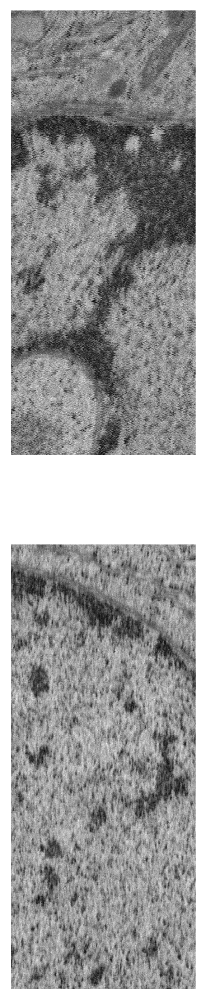

In [57]:
fig, axs = plt.subplots(dpi=300, nrows=2, figsize=(12,12))
from skimage.exposure import rescale_intensity as rescale
def proc(im):
    return rescale(im.astype('float'), out_range=(1,0)) ** 2

axs[0].imshow(proc(moving_tmp)[2500:(2500 + 1200), 5238:(5238 + 500)], cmap='gray')
axs[1].imshow(proc(fixed_tmp)[2500:(2500 + 1200), 6177:(6177 + 500)], cmap='gray')
[ax.axis('off') for ax in axs]

[(-0.5, 1312.5, 1070.5, -0.5), (-0.5, 2914.5, 2190.5, -0.5)]

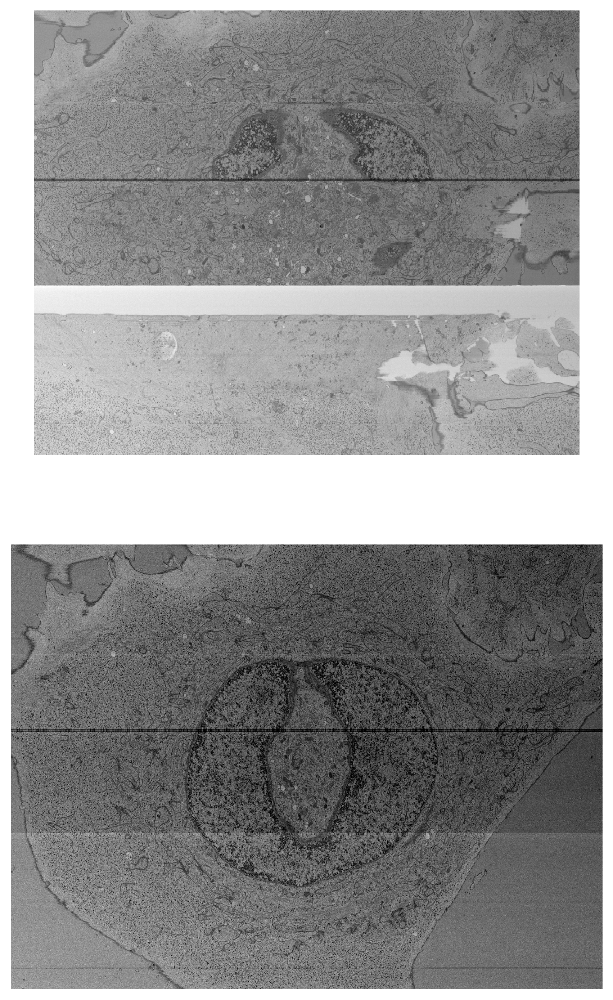

In [26]:
fig, axs = plt.subplots(dpi=300, nrows=2, figsize=(12,12))
from skimage.exposure import rescale_intensity as rescale
def proc(im):
    return rescale(im.astype('float'), out_range=(1,0)) ** 2
axs[0].imshow(proc(moving_tmp[::4,31])[200:-350, 100:-150], cmap='gray')
axs[1].imshow(proc(fixed_tmp[:,::4])[300:-750, 200:-200], cmap='gray', clim=(.2,1))
[ax.axis('off') for ax in axs]